<a href="https://colab.research.google.com/github/Alexandross1/Lower_limb_exoskeleton_control_system_finished/blob/main/Caly_algorytm_sterowania.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

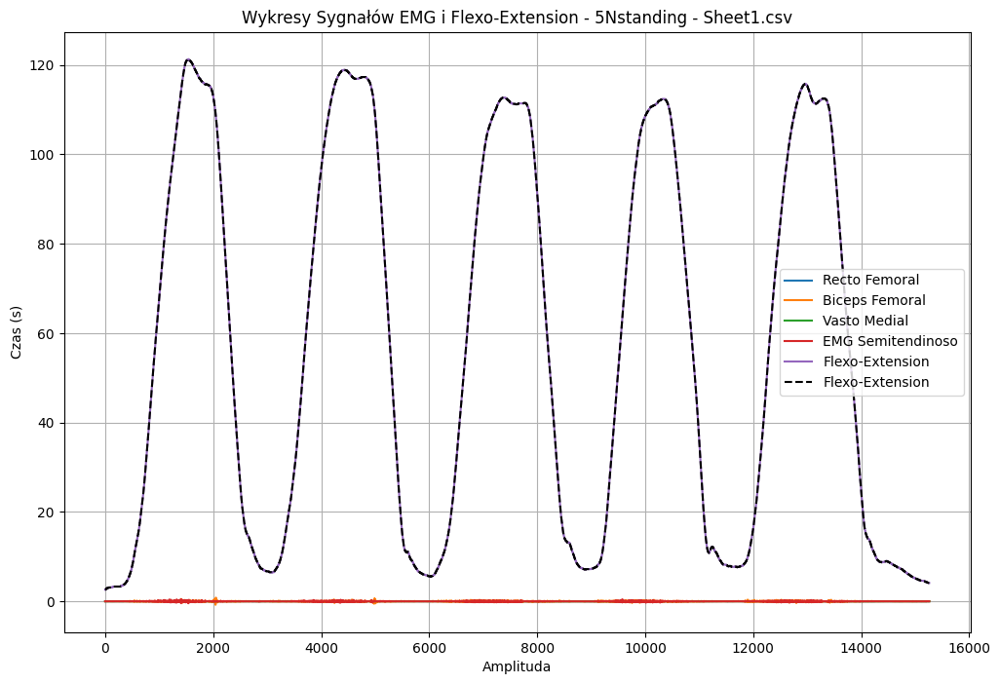

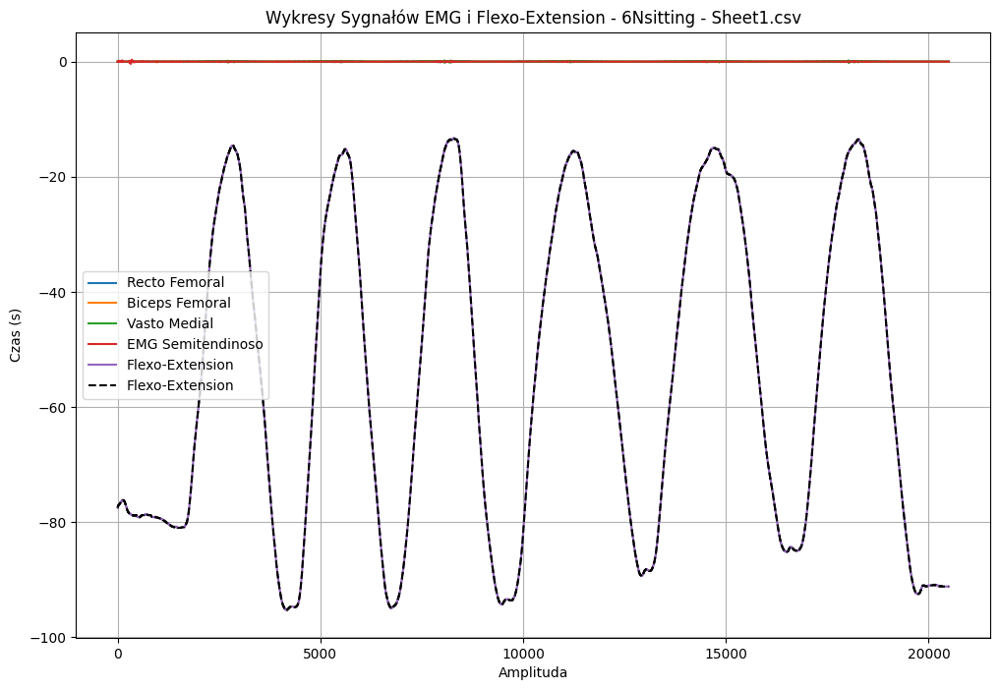

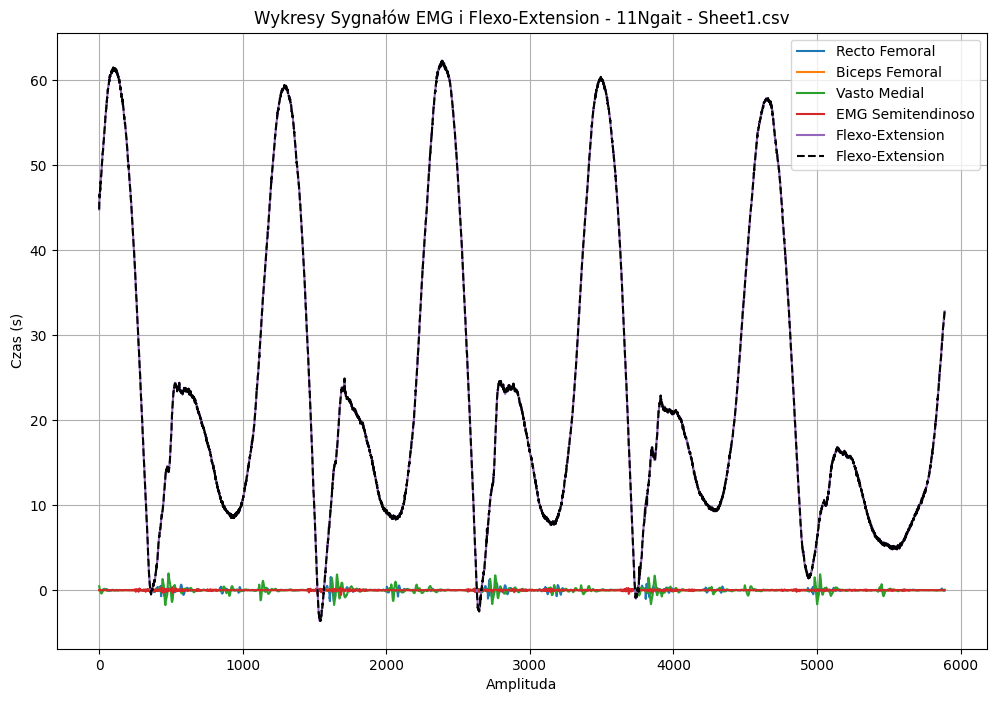

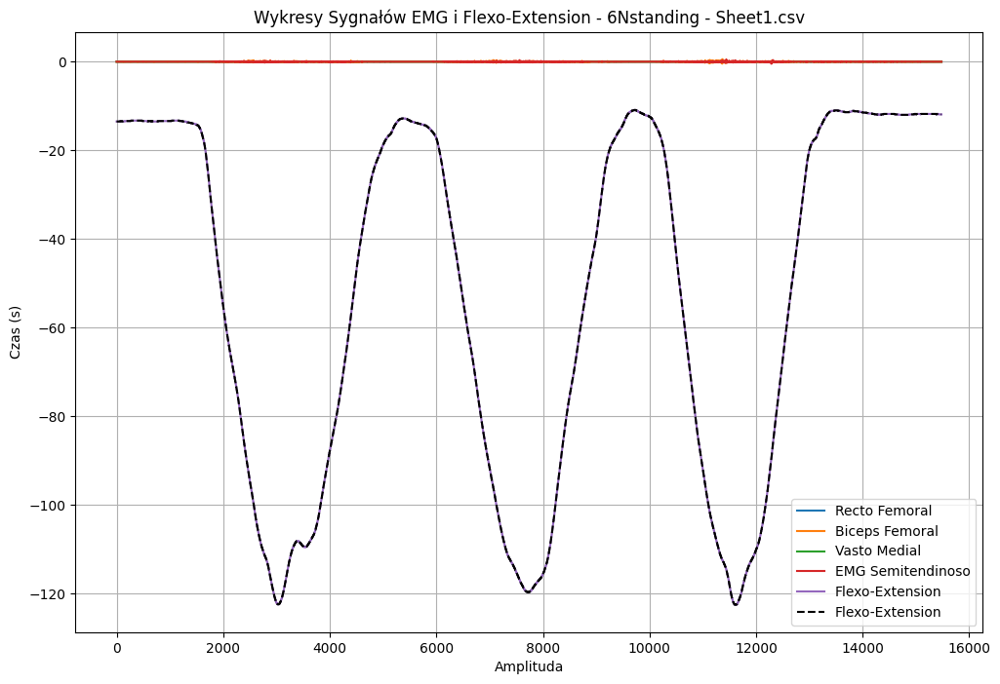

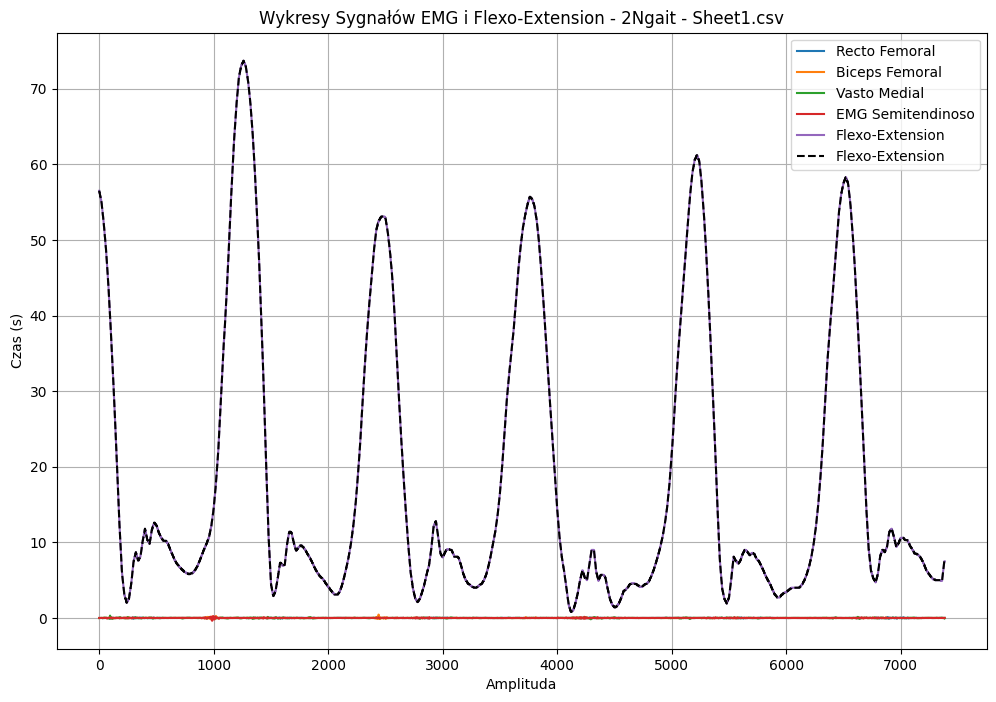

...

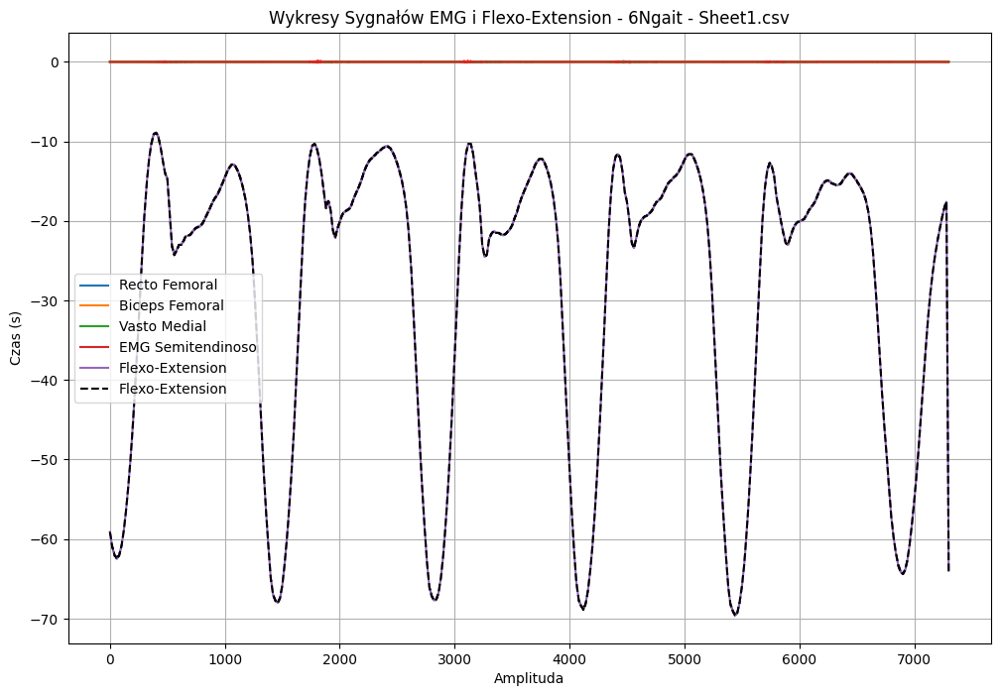

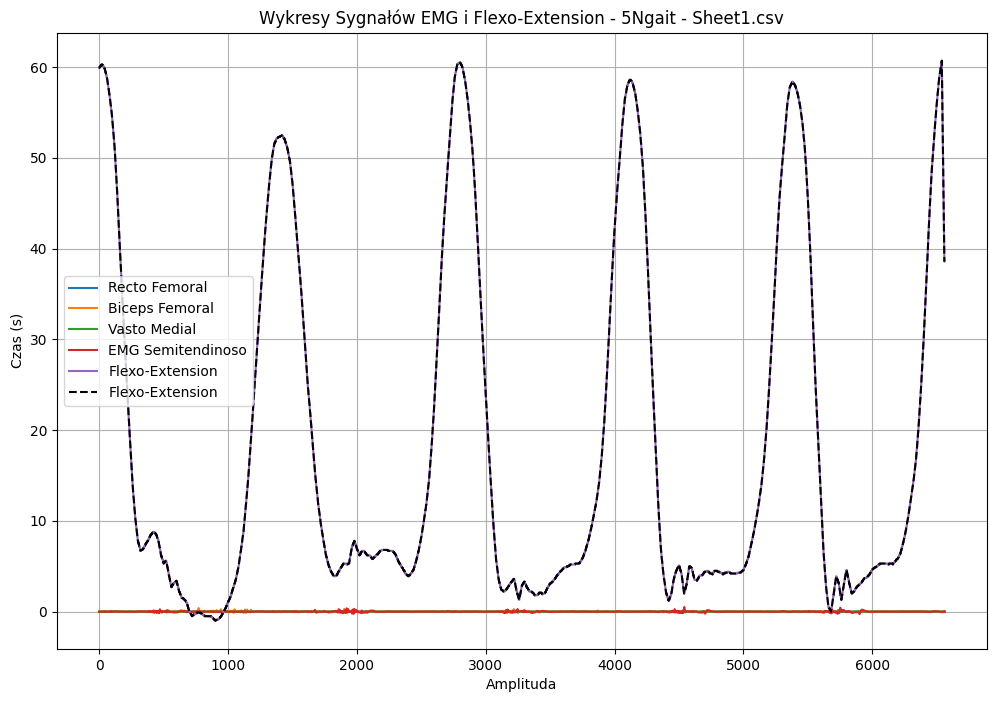

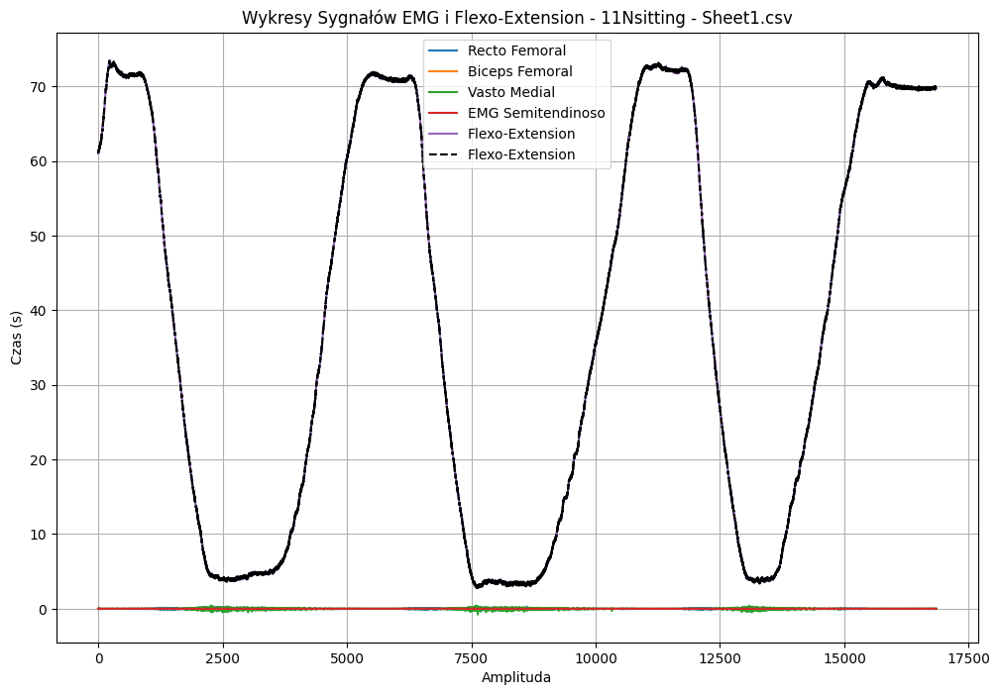

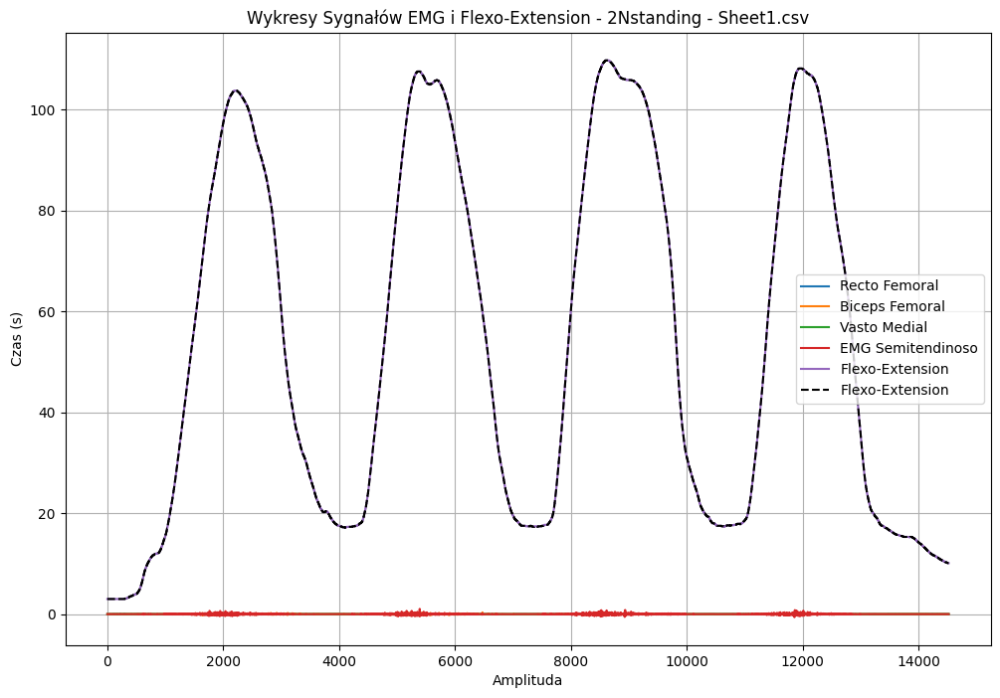

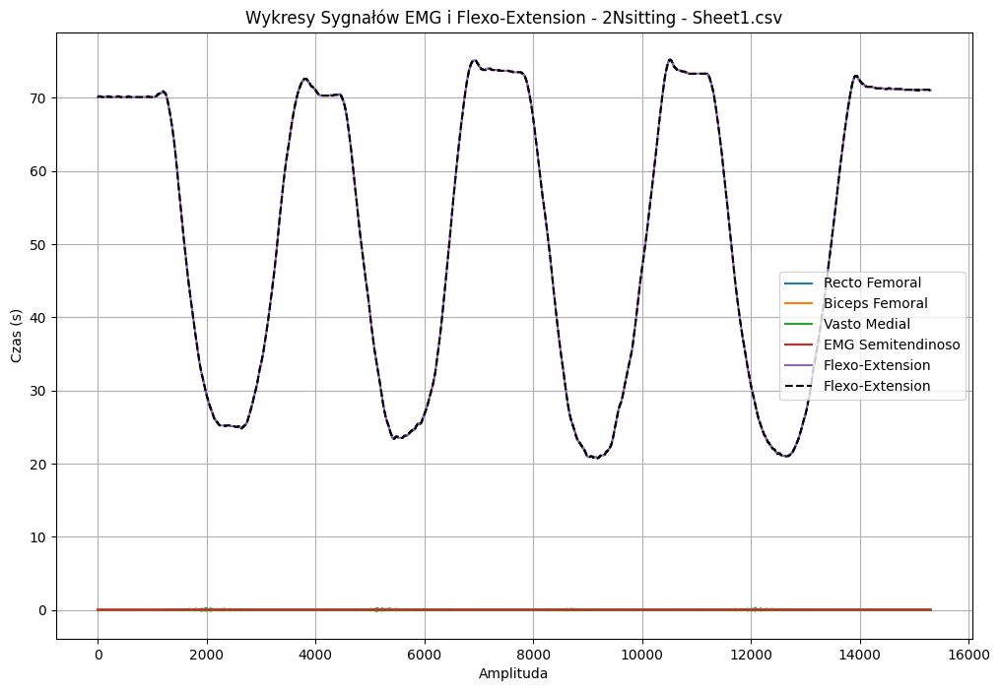

In [21]:
# WCZYTANIE DANYCH

import os
import pandas as pd
import matplotlib.pyplot as plt

# Ścieżka do folderu zawierającego pliki CSV
folder_path = '/content/Normal'

# Pobranie listy plików CSV w folderze
csv_files = [file for file in os.listdir(folder_path) if file.endswith('.csv')]

# Iteracja przez wszystkie pliki CSV w folderze
for file in csv_files:
    file_path = os.path.join(folder_path, file)

    # Wczytanie danych z pliku CSV
    data = pd.read_csv(file_path)

    emg_columns = data.columns[0:]

    # Sprawdzenie czy kolumna 'Flexo-Extension' istnieje w danych
    flexo_extension_column = 'Flexo-Extension'
    if flexo_extension_column in data.columns:
        # Tworzenie wykresów dla każdego sygnału EMG
        plt.figure(figsize=(12, 8))
        for column in emg_columns:
            plt.plot(data[column], label=column)

        # Wykres Flexo-Extension
        plt.plot( data[flexo_extension_column], label=flexo_extension_column, linestyle='--', color='black')

        plt.title(f'Wykresy Sygnałów EMG i Flexo-Extension - {file}')
        plt.ylabel('Czas (s)')
        plt.xlabel('Amplituda')
        plt.legend()
        plt.grid(True)
        plt.show()
    else:
        print(f"Warning: {flexo_extension_column} not found in {file}")


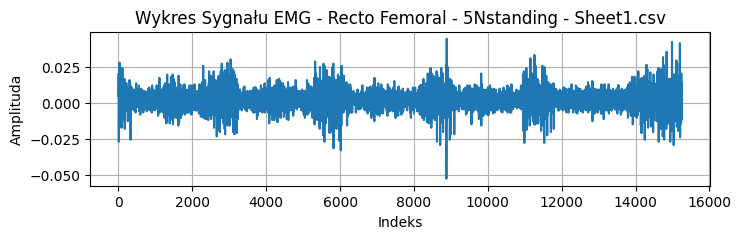

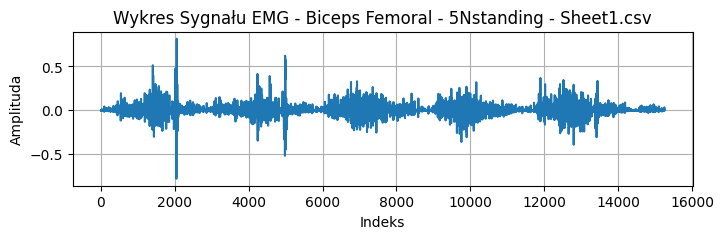

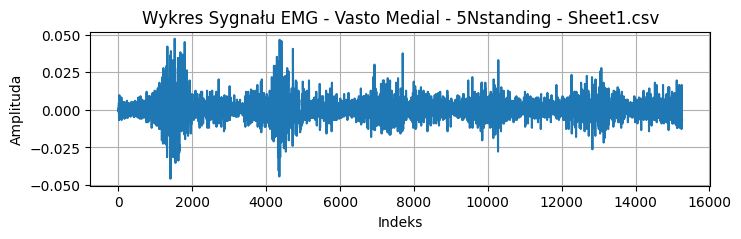

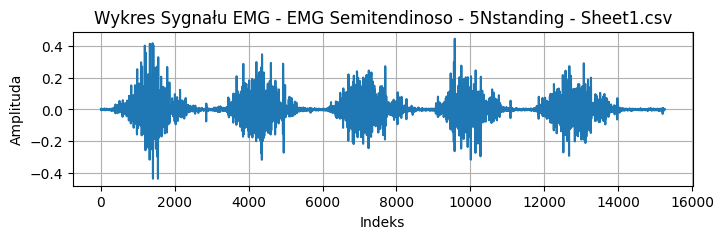

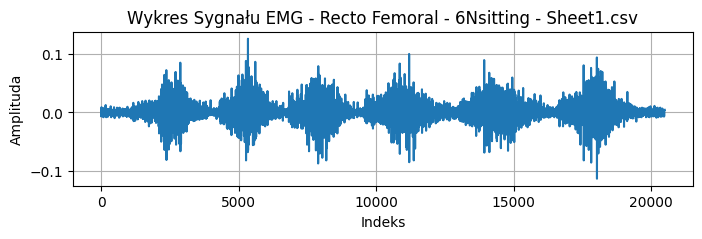

...

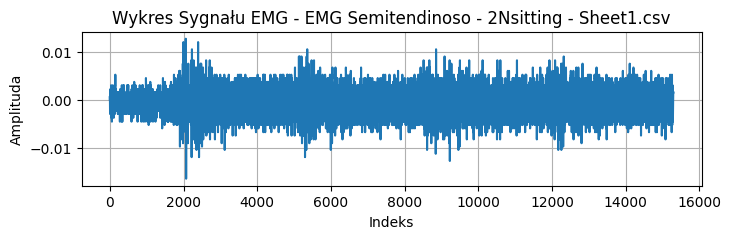

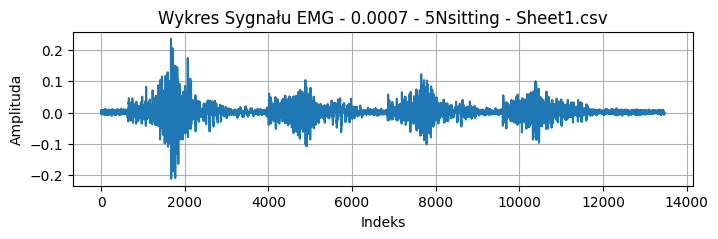

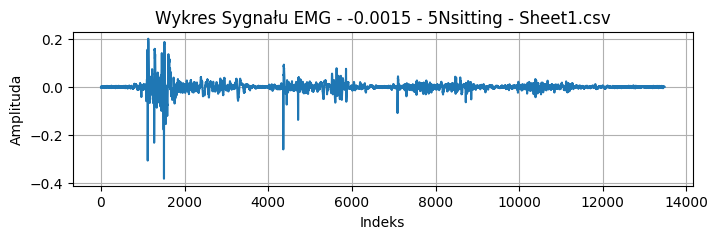

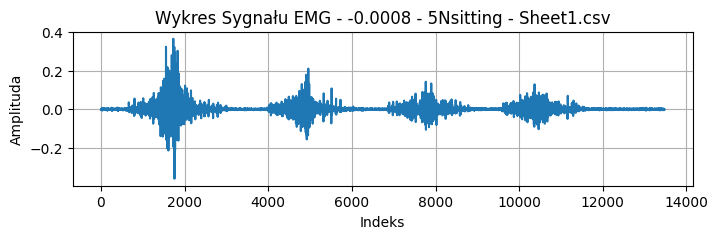

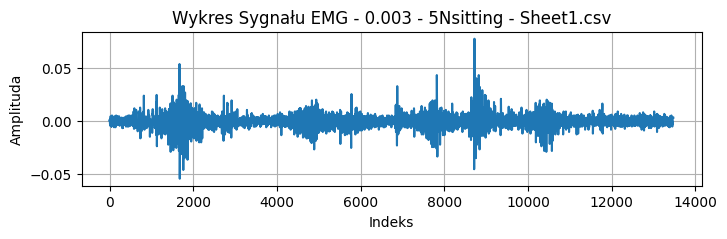

In [22]:
# WYODREBNIENIE EMG

import os
import pandas as pd
import matplotlib.pyplot as plt

# Ścieżka do folderu zawierającego pliki CSV
folder_path = '/content/Normal'

# Pobranie listy plików CSV w folderze
csv_files = [file for file in os.listdir(folder_path) if file.endswith('.csv')]

# Iteracja przez wszystkie pliki CSV w folderze
for file in csv_files:
    file_path = os.path.join(folder_path, file)

    data = pd.read_csv(file_path)

    emg_columns = data.columns[:-1]

    # wykresy dla każdego sygnału EMG
    for column in emg_columns:
        plt.figure(figsize=(8, 2))
        plt.plot(data[column])
        plt.title(f'Wykres Sygnału EMG - {column} - {file}')
        plt.xlabel('Indeks')
        plt.ylabel('Amplituda')
        plt.grid(True)
        plt.show()

    # wykresy dla kolumny 'Flexo-Extension'
   # plt.figure(figsize=(12, 8))
   # plt.plot(data['Flexo-Extension'], linestyle='--', color='black')
   # plt.title(f'Wykres Sygnału Flexo-Extension - {file}')
   # plt.xlabel('Indeks')
   # plt.ylabel('Amplituda')
   # plt.grid(True)
   # plt.show()


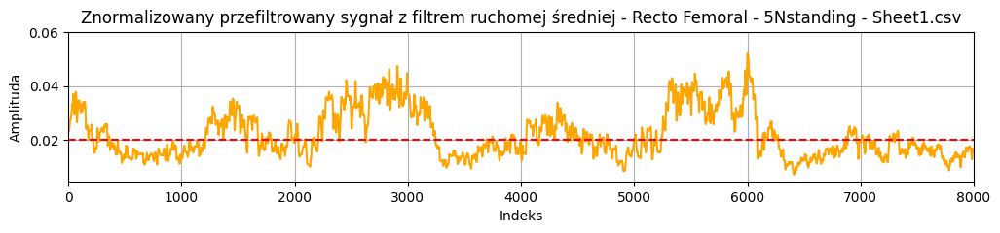

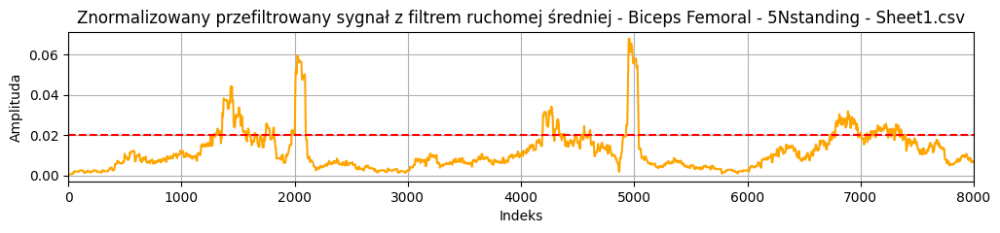

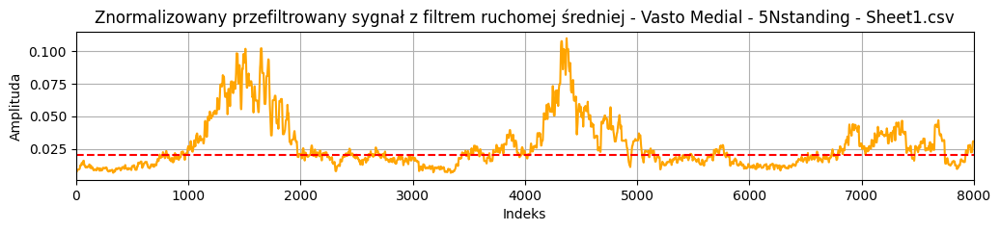

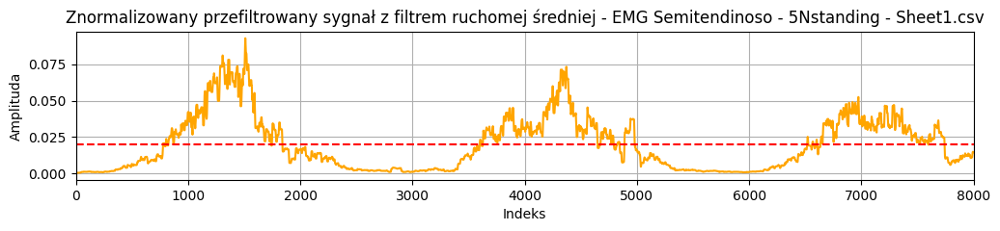

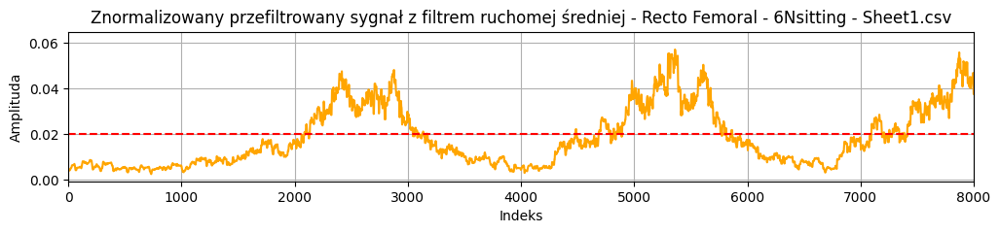

...

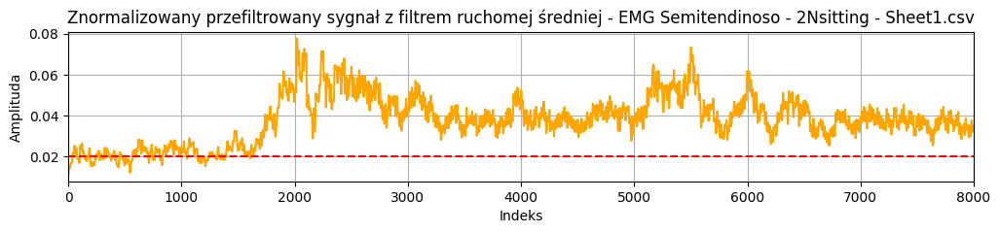

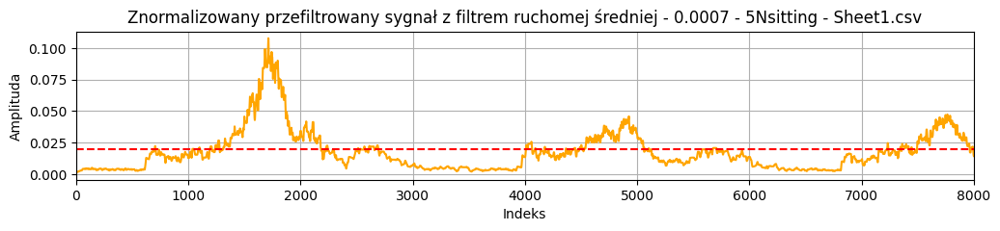

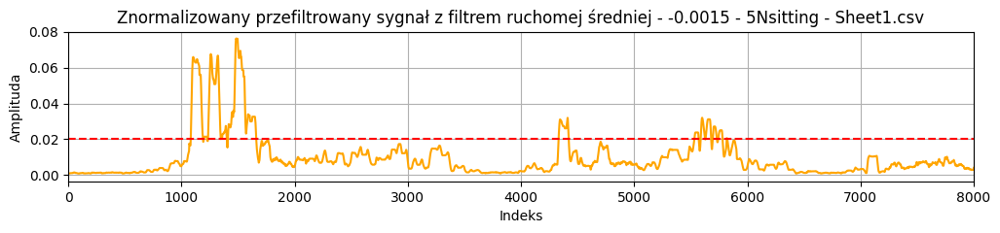

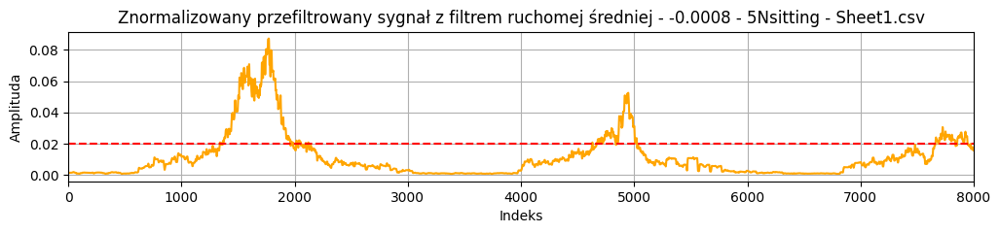

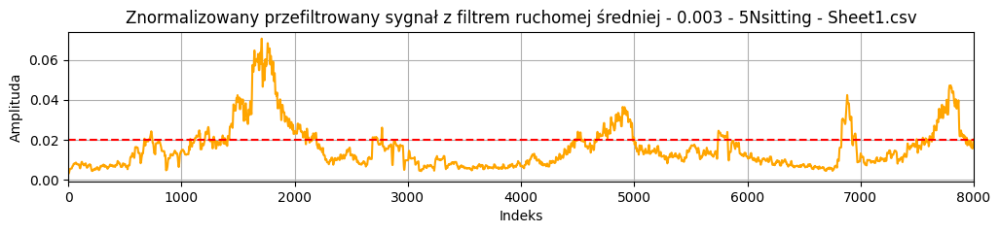

In [23]:
# FILTROWANIE I USTAWIENIE PROGU AKTYWNOSCI

import os
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import butter, filtfilt
import numpy as np

# Funkcja do aplikowania filtru górnoprzepustowego Butterworth
def highpass_filter(data, cutoff_frequency, sampling_rate, order=4):
    nyquist = 0.5 * sampling_rate
    normal_cutoff = cutoff_frequency / nyquist
    b, a = butter(order, normal_cutoff, btype='high', analog=False)
    y = filtfilt(b, a, data)
    return y

# Funkcja do zastosowania filtru ruchomej średniej
def moving_average(signal, window_size):
    return np.convolve(signal, np.ones(window_size)/window_size, mode='same')

# Ścieżka do folderu zawierającego pliki CSV
folder_path = '/content/Normal'

# Pobranie listy plików CSV w folderze
csv_files = [file for file in os.listdir(folder_path) if file.endswith('.csv')]

# Iteracja przez wszystkie pliki CSV w folderze
for file in csv_files:
    file_path = os.path.join(folder_path, file)

    # Wczytanie danych z pliku CSV
    data = pd.read_csv(file_path)

    emg_columns = data.columns[:-1]  # Wszystkie kolumny, pomijając ostatnią ('Flexo-Extension')

    # Normalizacja i zastosowanie filtru górnoprzepustowego dla każdej kolumny sygnałów EMG
    for column in emg_columns:
        # Normalizacja dla zakresu [0, 1]
        normalized_signal = (data[column] - data[column].min()) / (data[column].max() - data[column].min())

        # Zastosowanie filtru górnoprzepustowego
        cutoff_frequency = 1
        sampling_rate = 120
        highpass_filtered_signal = highpass_filter(normalized_signal, cutoff_frequency, sampling_rate)

        # Odcinanie amplitud poniżej zera
        highpass_filtered_signal[highpass_filtered_signal < 0] = 0

        # Zastosowanie filtru ruchomej średniej
        window_size = 90
        moving_avg_filtered_signal = moving_average(highpass_filtered_signal, window_size)

        # Tworzenie wykresu
        plt.figure(figsize=(12, 2))
        #plt.plot(highpass_filtered_signal, label=f'Znormalizowany z filtrem górnoprzepustowym i odciętymi amplitudami poniżej zera')
        plt.plot(moving_avg_filtered_signal, color='orange')
        plt.title(f'Znormalizowany przefiltrowany sygnał z filtrem ruchomej średniej - {column} - {file}')
        plt.xlabel('Indeks')
        plt.xlim(0, 8000)
        plt.axhline(y=0.02, color='r', linestyle='--', label='Progi aktywacji')
        plt.ylabel('Amplituda')
        plt.grid(True)
        #plt.legend()
        plt.show()


In [24]:
# FUNKCJA DEFINIUJĄCA AKTYWNOSC EGZOSZKIELETU NA PODSTAWIE PROGU AKTYWNOSCI

def exoskeleton_control(emg_signals, emg_threshold=0.02):
    # Inicjalizacja pustej listy wyników
    results = []

    # Iteracja przez każdy punkt czasowy
    for emg_signal_value in emg_signals:
        # Sprawdzenie aktywacji na podstawie sygnału EMG
        emg_activation = emg_signal_value > emg_threshold

        # Dodanie wyniku do listy
        if emg_activation:
            results.append(1)
        else:
            results.append(0)

    return results

In [25]:
# CAŁY ZAMYSŁ DZIAŁANIA EGZOSZKIELETU

class ExoskeletonController:
    def __init__(self, joint_angle=None, target_angle=None):
        self.joint_angle = joint_angle
        self.target_angle = target_angle

    def control_algorithm(self):
        # Algorytm, który dąży do ustawienia joint_angle na target_angle
        if self.target_angle is not None and self.joint_angle is not None:
            self.joint_angle += 0.05 * (self.target_angle - self.joint_angle)


def extract_flexo_extension(angles_data, activity_results):
    extracted_angles = []
    prev_angle = None

    target_angles = angles_data

    # Inicjacja algorytmu sterowania
    controller = ExoskeletonController(angles_data.iloc[0], None)

    for index, (angle, activity, target_angle) in enumerate(zip(angles_data, activity_results, target_angles)):
        if activity == 1:
            controller.target_angle = target_angle

            # Wywołanie algorytmu sterowania, aby dostosować kąt stawu
            controller.control_algorithm()

            # Pobranie i dodanie do listy nowego kąta stawu po dostosowaniu
            adjusted_angle = controller.joint_angle
            extracted_angles.append(adjusted_angle)
            prev_angle = adjusted_angle
        else:
            if prev_angle is not None:
              # Jeśli nie ma aktywności, ale był poprzedni kąt, użyj go
              adjusted_angle = controller.joint_angle
              extracted_angles.append(adjusted_angle)
              prev_angle = adjusted_angle
            else:
              # Jeśli nie ma aktywności ani poprzedniego kąta, użyj aktualnego kąta
              adjusted_angle = controller.joint_angle
              extracted_angles.append(adjusted_angle)
              prev_angle = adjusted_angle

    return extracted_angles

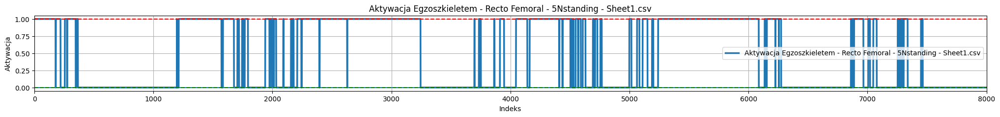

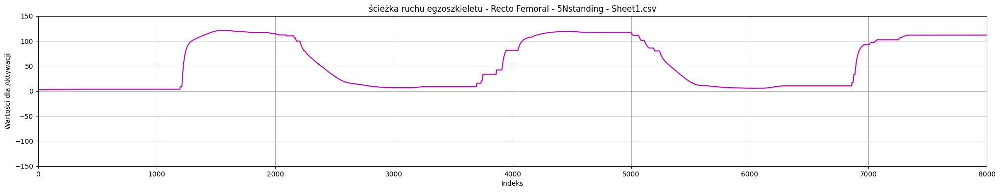

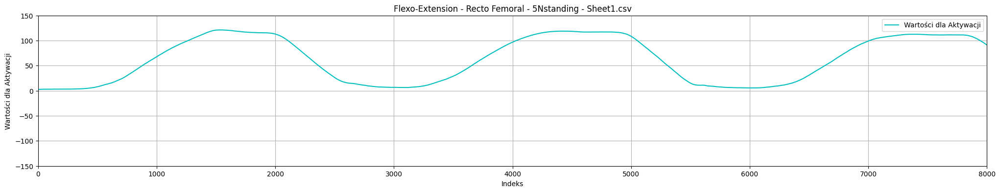

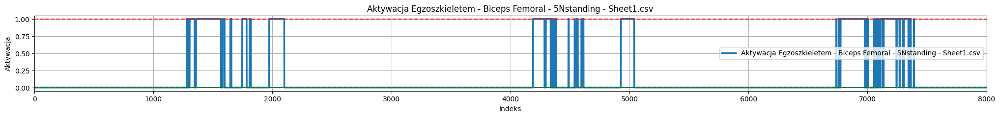

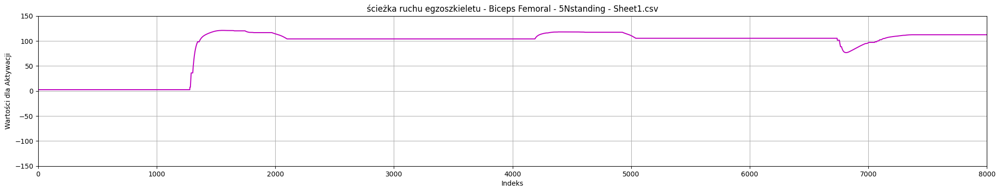

...

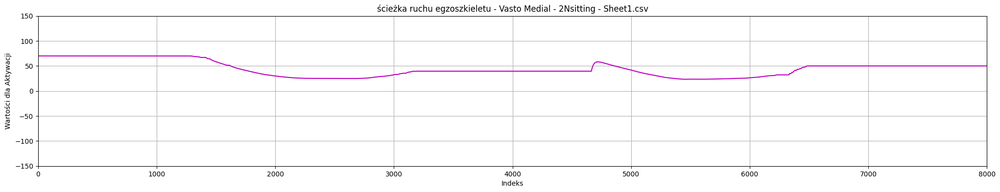

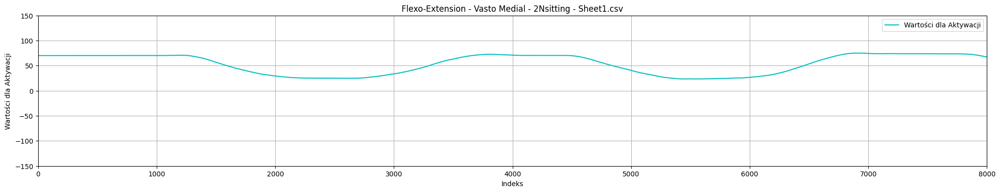

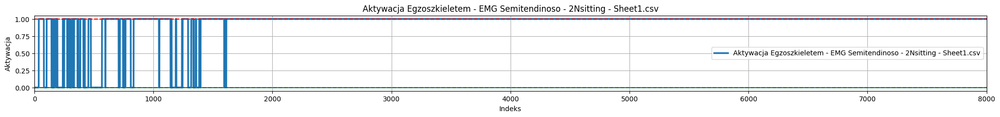

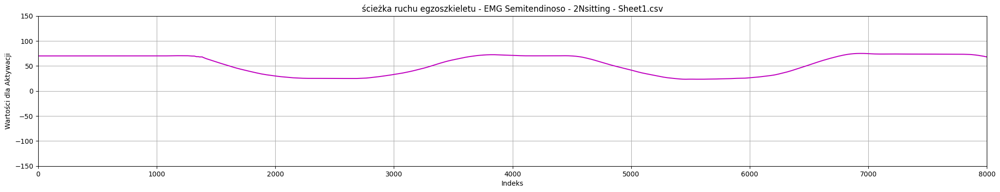

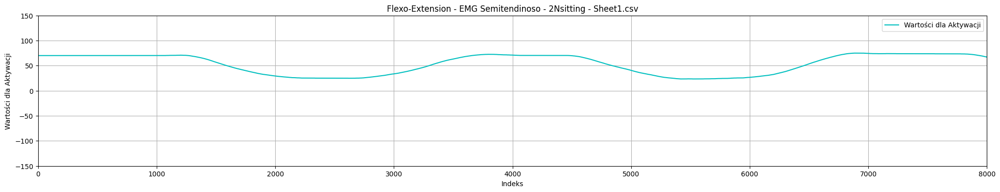

In [26]:
# SYMULACJA ALGORYTMU

import os
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import butter, filtfilt
import numpy as np

# Funkcja do aplikowania filtru górnoprzepustowego Butterworth
def highpass_filter(data, cutoff_frequency, sampling_rate, order=4):
    nyquist = 0.5 * sampling_rate
    normal_cutoff = cutoff_frequency / nyquist
    b, a = butter(order, normal_cutoff, btype='high', analog=False)
    y = filtfilt(b, a, data)
    return y

# Funkcja do zastosowania filtru ruchomej średniej
def moving_average(signal, window_size):
    return np.convolve(signal, np.ones(window_size)/window_size, mode='same')

# Ścieżka do folderu zawierającego pliki CSV
folder_path = '/content/Normal'

# Pobranie listy plików CSV w folderze
csv_files = [file for file in os.listdir(folder_path) if file.endswith('.csv')]

# Iteracja przez wszystkie pliki CSV w folderze
for file in csv_files:
    file_path = os.path.join(folder_path, file)

    # Wczytanie danych z pliku CSV
    data = pd.read_csv(file_path)

    emg_columns = data.columns[:-1]

    # Normalizacja i zastosowanie filtru górnoprzepustowego dla każdej kolumny sygnałów EMG
    for column in emg_columns:
        # Normalizacja dla zakresu [0, 1]
        normalized_signal = (data[column] - data[column].min()) / (data[column].max() - data[column].min())

        # Zastosowanie filtru górnoprzepustowego
        cutoff_frequency = 1
        sampling_rate = 120
        highpass_filtered_signal = highpass_filter(normalized_signal, cutoff_frequency, sampling_rate)

        # Odcinanie amplitud poniżej zera
        highpass_filtered_signal[highpass_filtered_signal < 0] = 0

        # Zastosowanie filtru ruchomej średniej
        window_size = 90
        moving_avg_filtered_signal = moving_average(highpass_filtered_signal, window_size)
        flexo_extension_column = 'Flexo-Extension'
        if flexo_extension_column in data.columns:
          # Symulacja algorytmu sterowania egzoszkieletem
          angles_data = data['Flexo-Extension']
          activity_results = exoskeleton_control(moving_avg_filtered_signal)
          extracted_angles = extract_flexo_extension(angles_data, activity_results)

          # wykresy dla activity
          plt.figure(figsize=(25, 2))
          plt.plot(activity_results, label=f'Aktywacja Egzoszkieletem - {column} - {file}', linewidth=2.5)
          plt.title(f'Aktywacja Egzoszkieletem - {column} - {file}')
          plt.xlabel('Indeks')
          plt.axhline()
          plt.xlim(0, 8000)
          plt.axhline(y=0, color='g', linestyle='--')
          plt.axhline(y=1, color='r', linestyle='--')
          plt.ylabel('Aktywacja')
          plt.grid(True)
          plt.legend()
          plt.show()


          # wykresy dla extracted_angles
          plt.figure(figsize=(25, 4))
          plt.plot(extracted_angles, color='m')
          plt.title(f'ścieżka ruchu egzoszkieletu - {column} - {file}')
          plt.xlim(0, 8000)
          plt.ylim(-150, 150)
          plt.xlabel('Indeks')
          plt.ylabel('Wartości dla Aktywacji')
          plt.grid(True)
          plt.show()


          # wykresy dla flexo extension
          plt.figure(figsize=(25, 4))
          plt.plot(angles_data, color='c', label='Wartości dla Aktywacji')
          plt.title(f'Flexo-Extension - {column} - {file}')
          plt.xlim(0, 8000)
          plt.ylim(-150, 150)
          plt.xlabel('Indeks')
          plt.ylabel('Wartości dla Aktywacji')
          plt.grid(True)
          plt.legend()
          plt.show()